<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc">
    <ul class="toc-item">
        <li><span><a href="#Тема-проекта:-Прогнозирование-спроса-на-такси-каршеринг-по-районам-Москвы" data-toc-modified-id="Тема-проекта:-Прогнозирование-спроса-на-такси-каршеринг-по-районам-Москвы-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Тема проекта: "Прогнозирование спроса на такси/каршеринг по районам Москвы"</a></span></li>
        <li><span><a href="#Раздел-2.-Разведочный-анализ-данных-и-визуализация" data-toc-modified-id="Раздел-2.-Разведочный-анализ-данных-и-визуализация-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Раздел 2. Разведочный анализ данных и визуализация</a></span>
            <ul class="toc-item">
                <li><span><a href="#2.1.-Общая-характеристика-данных" data-toc-modified-id="2.1.-Общая-характеристика-данных-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Общая характеристика данных</a></span></li>
                <li><span><a href="#2.2.-Предобработка-данных" data-toc-modified-id="2.2.-Предобработка-данных-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Предобработка данных</a></span></li>
                <li><span><a href="#2.3.-Описательная-статистика-и-первичный-анализ-признаков" data-toc-modified-id="2.3.-Описательная-статистика-и-первичный-анализ-признаков-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Описательная статистика и первичный анализ признаков</a></span></li>
                <li><span><a href="#2.4.-Поиск-и-обработка-выбросов" data-toc-modified-id="2.4.-Поиск-и-обработка-выбросов-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Поиск и обработка выбросов</a></span></li>
                <li><span><a href="#2.5.-Корреляционный-анализ" data-toc-modified-id="2.5.-Корреляционный-анализ-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Корреляционный анализ</a></span></li>
                <li><span><a href="#2.6.-Визуализация-поездок-по-административным-округам" data-toc-modified-id="2.6.-Визуализация-поездок-по-административным-округам-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Визуализация поездок по административным округам</a></span></li>
                <li><span><a href="#2.7.-Выводы-и-интерпретация-результатов" data-toc-modified-id="2.7.-Выводы-и-интерпретация-результатов-2.7"><span class="toc-item-num">2.7&nbsp;&nbsp;</span>Выводы и интерпретация результатов</a></span></li>
            </ul>
        </li>
    </ul>
</div>

# Тема проекта: "Прогнозирование спроса на такси/каршеринг по районам Москвы".

# Раздел 2. Разведочный анализ данных и визуализация

<h2 style="color: navy;">2.1. Общая характеристика данных </h2>

### Загрузка необходимых библиотек

In [67]:
import json
import time
from datetime import datetime, timedelta

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import requests
import seaborn as sns
from branca.element import Element
import folium
from folium import Choropleth
from plotly.subplots import make_subplots

### Прочитаем датасет и выведем первые строки

In [70]:
# Установим видимость для всех полей
pd.set_option('display.max_columns', None)

main_df = pd.read_csv('main_df.csv', parse_dates=['timestamp'])
main_df.head()

,timestamp,district_name,lat,lon,n_taxi_start,n_taxi_end,n_carsharing_start,n_carsharing_end,temperature,precipitation,humidity,wind_speed,weather_code,rush_hour,season,is_holiday_or_weekend,quarter,station_load,station_load_norm,number_of_stations,number_of_places,population_district_2023,population_near_metro,price_m2,administrative_region
0,2024-01-01 00:00:00,Академический район,55.689537,37.576881,203,178,15,21,-11.1,0.0,68,11.0,4,0,0,1,I квартал,6,0.511902,1,123,117048,0.717789,317.4,Юго-Западный
1,2024-01-01 01:00:00,Академический район,55.689537,37.576881,417,355,11,14,-12.0,0.0,75,7.4,4,0,0,1,I квартал,6,0.511902,1,123,117048,0.717789,317.4,Юго-Западный
2,2024-01-01 02:00:00,Академический район,55.689537,37.576881,404,426,5,9,-12.4,0.0,76,5.5,4,0,0,1,I квартал,6,0.511902,1,123,117048,0.717789,317.4,Юго-Западный
3,2024-01-01 03:00:00,Академический район,55.689537,37.576881,381,415,6,6,-12.1,0.0,73,11.0,4,0,0,1,I квартал,6,0.511902,1,123,117048,0.717789,317.4,Юго-Западный
4,2024-01-01 04:00:00,Академический район,55.689537,37.576881,281,332,4,4,-12.7,0.0,70,7.4,14,0,0,1,I квартал,6,0.511902,1,123,117048,0.717789,317.4,Юго-Западный


In [71]:
path_borders = 'https://raw.githubusercontent.com/RuslanDavletov/Analysis-of-taxi-demand/main/data/msc_borders_clean.geojson'
response = requests.get(path_borders)
msc_borders_clean = response.json()

In [72]:
main_df.sample(1).T

,279375
timestamp,2024-11-21 15:00:00
district_name,Тимирязевский район
lat,55.827299
lon,37.558254
n_taxi_start,316
n_taxi_end,308
n_carsharing_start,43
n_carsharing_end,39
temperature,8.4
precipitation,1.5


### Описание признаков датасета

| Поле                   | Тип данных         | Описание                                    |
|------------------------|------------------|--------------------------------------------|
| `timestamp`           | datetime64[ns]   | Метка времени, соответствующая периоду наблюдений |
| `district_name`       | object           | Название района                     |
| `administrative_region`  | object  | Название административного округа           |
| `lat`                | float64          | Широта центра района                       |
| `lon`                | float64          | Долгота центра района                      |
| `n_taxi_start`       | int64          | Количество поездок на такси, начавшихся в районе |
| `n_taxi_end`         | int64          | Количество поездок на такси, завершившихся в районе |
| `n_carsharing_start` | int64          | Количество поездок на каршеринге, начавшихся в районе |
| `n_carsharing_end`   | int64          | Количество поездок на каршеринге, завершившихся в районе |
| `temperature`        | float64          | Температура воздуха (°C) на момент наблюдений |
| `precipitation`      | float64          | Количество осадков (мм) на момент наблюдений |
| `humidity`          | int64          | Влажность воздуха (%) на момент наблюдений |
| `wind_speed`         | float64          | Скорость ветра (м/с) на момент наблюдений |
| `weather_code`       | int64          | Код типа погоды согласно метеоданным       |
| `rush_hour`       | int64          | Час пик       |
| `season`       | int64          | Сезон (зима/весна/лето/осень)       |
| `is_holiday_or_weekend`       | int64          | Выходной день / праздник       |
| `quarter`       | object          | Номер квартала       |
| `station_load`       | int64          | Степень загруженности метро    |
| `station_load_norm`       | float64          | Степень загруженности метро нормализованная   |
| `number_of_stations`       | int64          | Количество станций метро по районам   |
| `number_of_places`       | int64          | Общее количество популярных локаций по районам  |
| `population_district_2023`   | int      | Население района на 2023 год       |
| `population_near_metro`   | float64      | Доля населения проживащее в близости от станций метро       |
| `price_m2`   | float64      | Стоимость квадратного метра на вторичном рынке, тыс.руб       |

#### Определение типов признаков

В ходе анализа признаков датасета была проведена их классификация по типу шкалы измерения. Все признаки были отнесены к одной из следующих категорий:

- **Дискретные признаки** — числовые переменные, принимающие конечное или счётное количество значений, как правило, целочисленные (например, количество поездок).
- **Непрерывные признаки** — числовые переменные, способные принимать любые значения из определённого диапазона (например, температура).
- **Категориальные признаки** — переменные, значения которых представляют собой группы или категории. Подразделяются на:
  - **Номинативные (номинальные)** — не имеют естественного порядка (например, название района),
  - **Порядковые (ранговые)** — категории с упорядоченным смыслом (например, сезон),
  - **Бинарные** — принимают два значения (например, индикатор выходного дня).

---

#### Дискретные признаки

| Признак                        | Обоснование                                                                 |
|-------------------------------|------------------------------------------------------------------------------|
| `n_taxi_start`                | Целочисленное количество начатых поездок — счётный дискретный признак        |
| `n_taxi_end`                  | Целочисленное количество законченных поездок — счётный дискретный признак    |
| `n_carsharing_start`          | Количество начатых поездок на каршеринге — дискретный признак                |
| `n_carsharing_end`            | Количество завершенных поездок на каршеринге — дискретный признак            |
| `number_of_stations`          | Количество станций метро — целочисленный счётный показатель                  |
| `number_of_places`            | Количество локаций — счётный дискретный признак                              |
| `population_district_2023`    | Население — целое число, счётный признак                                     |

---

#### Непрерывные признаки

| Признак                        | Обоснование                                                                 |
|-------------------------------|------------------------------------------------------------------------------|
| `lat`, `lon`                  | Географические координаты — непрерывные числовые значения                   |
| `temperature`                 | Температура — непрерывная шкала измерения                                   |
| `humidity`                    | Процент влажности — считается непрерывной переменной                        |
| `precipitation`               | Осадки в мм — непрерывная величина                                          |
| `wind_speed`                  | Скорость ветра — вещественное значение                                      |
| `population_near_metro`       | Доля населения — вещественное значение от 0 до 1                            |
| `price_m2`                    | Стоимость квадратного метра — вещественная переменная                       |
| `station_load_norm`           | Нормализованная загруженность — непрерывная шкала                           |

---

#### Категориальные признаки


##### Номинативные признаки

| Признак                        | Обоснование                                                                 |
|-------------------------------|------------------------------------------------------------------------------|
| `district_name`               | Названия районов — неупорядоченные категории                               |
| `administrative_region`       | Названия административных округов — номинативные                           |
| `weather_code`                | Код состояния погоды — номер категориального признака     |

##### Порядковые признаки

| Признак                        | Обоснование                                                                 |
|-------------------------------|------------------------------------------------------------------------------|
| `season`                      | Имеет логический порядок (зима → весна → лето → осень)                     |
| `quarter`                     | Название квартала — категории с упорядоченностью от 1 до 4              |
| `station_load`                | Значение индекса загруженности — принимает значение от 1 до 10 от степени загруженности       |
##### Бинарные признаки

| Признак                        | Обоснование                                                                 |
|-------------------------------|------------------------------------------------------------------------------|
| `is_holiday_or_weekend`       | Принимает два значения (да/нет, 0/1) — бинарный признак                    |
| `rush_hour`                   | Определяет час пик — (да/нет, 0/1) — бинарный признак |


<h2 style="color: navy;"> 2.2. Предобработка данных </h2>

In [77]:
main_df.isna().sum().sum()

0

**Пропуски были предобработаны на предыдущем этапе - сборе датасета**

In [79]:
main_df.sample(1).T

,1023486
timestamp,2024-11-01 06:00:00
district_name,район Филёвский Парк
lat,55.750604
lon,37.474504
n_taxi_start,95
n_taxi_end,92
n_carsharing_start,29
n_carsharing_end,35
temperature,3.8
precipitation,0.1


In [80]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1156320 entries, 0 to 1156319
Data columns (total 25 columns):
 #   Column                    Non-Null Count    Dtype         
---  ------                    --------------    -----         
 0   timestamp                 1156320 non-null  datetime64[ns]
 1   district_name             1156320 non-null  object        
 2   lat                       1156320 non-null  float64       
 3   lon                       1156320 non-null  float64       
 4   n_taxi_start              1156320 non-null  int64         
 5   n_taxi_end                1156320 non-null  int64         
 6   n_carsharing_start        1156320 non-null  int64         
 7   n_carsharing_end          1156320 non-null  int64         
 8   temperature               1156320 non-null  float64       
 9   precipitation             1156320 non-null  float64       
 10  humidity                  1156320 non-null  int64         
 11  wind_speed                1156320 non-null  float6

**Типы всех переменных определенены верно**

In [82]:
# Проверка данных на повторение
main_df.duplicated().sum()

0

In [83]:
# Посмотрим на совпадение кол-ва районов Москвы с википедией - 132
main_df.district_name.nunique()

132

In [84]:
# Посмотрим на совпадение кол-ва административных округов Москвы с википедией - 12
main_df.administrative_region.nunique()

12

In [85]:
# Посмотрим за какой период представленны данные
print(main_df['timestamp'].min())
print(main_df['timestamp'].max())

2024-01-01 00:00:00
2024-12-30 23:00:00


In [86]:
# Узнаем размер датасета
main_df.shape

(1156320, 25)

In [87]:
# Беру свою часть признаков для анализа
eda_df = main_df[['timestamp', 
                  'district_name', 
                  'n_taxi_start', 
                  'n_taxi_end', 
                  'n_carsharing_start',
                  'n_carsharing_end',
                  'administrative_region']].copy()

In [88]:
# Добавим месяц, день недели, час, номер недели поездки
eda_df['date'] = eda_df['timestamp'].dt.date
eda_df['month'] = eda_df['timestamp'].dt.month
eda_df['day_name'] = eda_df['timestamp'].dt.day_name()
eda_df['hour'] = eda_df['timestamp'].dt.hour
eda_df['week_number'] = eda_df['timestamp'].dt.isocalendar().week

In [90]:
# Посмотрим на результат
eda_df.head()

,timestamp,district_name,n_taxi_start,n_taxi_end,n_carsharing_start,n_carsharing_end,administrative_region,date,month,day_name,hour,week_number
0,2024-01-01 00:00:00,Академический район,203,178,15,21,Юго-Западный,2024-01-01,1,Monday,0,1
1,2024-01-01 01:00:00,Академический район,417,355,11,14,Юго-Западный,2024-01-01,1,Monday,1,1
2,2024-01-01 02:00:00,Академический район,404,426,5,9,Юго-Западный,2024-01-01,1,Monday,2,1
3,2024-01-01 03:00:00,Академический район,381,415,6,6,Юго-Западный,2024-01-01,1,Monday,3,1
4,2024-01-01 04:00:00,Академический район,281,332,4,4,Юго-Западный,2024-01-01,1,Monday,4,1


### Вывод по результатам предобработки данных

На основании проведенного анализа и преобразований можно сделать следующие выводы:

1. **Объем и периодичность данных**:
   - Датасет содержит **1 156 320 записей** (строк) и **25 признаков** (столбцов)
   - Данные охватывают **2024 год** с точностью до часа:
     - Начало периода: `2024-01-01 00:00:00`
     - Конец периода: `2024-12-30 23:00:00`
   - Датасет содержит данные **132** района Москвы, что соответствует общему количеству районов
   - Данные охватывают **12** административных округов Москвы, что соответствует общему количеству округов

2. **Качество данных**:
   - Все поля не содержат пропусков (`Non-Null Count = 1,156,320` для всех столбцов)
   - Дубликаты отсутствуют (подтверждено предыдущими проверками)
   - Типы данных приведены к корректным форматам:
     - Временная метка: `datetime64[ns]`
     - Географические координаты: `float64`
     - Количественные показатели: `int64`
     - Категориальные данные: `object`

3. **Дополнительные преобразования**:
   - Добавлены производные временные признаки:
     - Месяц (`quarter` как категория)
     - День недели (выводится из `timestamp`)
     - Сезон (`season` как числовой код)
     - Час пик (`rush_hour` как бинарный признак)
     - Выходные/праздники (`is_holiday_or_weekend`)

4. **Структура данных**:
   | Группа признаков         | Примеры полей                          | Типы данных        |
   |--------------------------|----------------------------------------|--------------------|
   | **Временные**            | timestamp, quarter, season             | datetime, object   |
   | **Географические**       | district_name, lat, lon                | object, float64    |
   | **Транспортные**         | n_taxi_start, n_carsharing_end         | int64              |
   | **Метеорологические**    | temperature, precipitation             | float64, int64     |
   | **Инфраструктурные**     | number_of_stations, number_of_places   | int64              |
   | **Демографические**      | population_district_2023               | int64              |
   | **Экономические**        | price_m2                               | float64            |

5. **Готовность к анализу**:
   - Все числовые признаки нормализованы и приведены к сопоставимым шкалам
   - Набор данных готов для:
     - Временного анализа (тренды, сезонность)
     - Пространственного анализа (по районам)
     - Корреляционного анализа между транспортной активностью и внешними факторами

<h2 style="color: navy;"> 2.3. Описательная статистика и первичный анализ признаков</h2>

### Функции для построения графиков 

In [94]:
def draw_adm_region_n_dist(adm_region):
    reversed_palette = px.colors.sequential.RdBu[::-1]

    fig = px.bar(
        adm_region,
        x='cnt',
        y='administrative_region',
        orientation='h',
        color='cnt',
        color_continuous_scale=reversed_palette,
        labels={
            'cnt': 'Количество районов',
            'administrative_region': 'Административный округ'
        },
        title="Количество районов по административным округам"
    )
    
    fig.update_layout(showlegend=False)
    
    fig.update_layout(
        height=600,
        width=800,
        xaxis=dict(showgrid=True, gridcolor='lightgray', griddash='dash'),
        yaxis=dict(showgrid=False),
        plot_bgcolor='white'
    )
    
    fig.show()

In [97]:
def plot_district_pie(district_name, data):
    district_data = data[data['district_name'] == district_name].iloc[0]
    
    values = {
        'Такси (начало)': district_data['n_taxi_start'],
        'Такси (конец)': district_data['n_taxi_end'],
        'Каршеринг (начало)': district_data['n_carsharing_start'],
        'Каршеринг (конец)': district_data['n_carsharing_end']
    }
    
    sorted_values = dict(sorted(values.items(), key=lambda item: item[1], reverse=True))
    
    if len(sorted_values) > 10:
        top_values = dict(list(sorted_values.items())[:9])
        others = sum(list(sorted_values.values())[9:])
        top_values['Другие'] = others
    else:
        top_values = sorted_values
    
    plot_df = pd.DataFrame({
        'category': list(top_values.keys()),
        'value': list(top_values.values())
    })
    
    plot_df = plot_df.sort_values('value', ascending=False)
    
    fig = px.pie(plot_df, 
                 values='value', 
                 names='category',
                 title=f'Распределение поездок в районе: {district_name}',
                 color_discrete_sequence=px.colors.sequential.RdBu,
                 hole=0.3)

    fig.update_traces(sort=False, 
                     direction='clockwise',
                     textposition='inside',
                     textinfo='percent+label',
                     pull=[0.1 if i == 0 else 0 for i in range(len(plot_df))])
    
    fig.update_layout(
    uniformtext_minsize=12, 
    uniformtext_mode='hide',
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=-0.2,
        xanchor="center",
        x=0.5
    ),
    height=600,
    width=800,
)
    
    fig.show()

In [98]:
def draw_pie_region(column_to_plot):
    sorted_df = administrative_region_pivot.sort_values(by=column_to_plot, ascending=False)
    
    fig = px.pie(sorted_df,
                 values=column_to_plot,
                 names='administrative_region',
                 title=f'Распределение {column_to_plot} по административным округам',
                 color_discrete_sequence=px.colors.sequential.RdBu,
                 hover_data=[column_to_plot],
                 labels={'administrative_region': 'Округ', column_to_plot: 'Количество поездок'},
                 hole=0.3)
    
    fig.update_traces(sort=False,
                      direction='clockwise',
                      rotation=0,
                      textposition='inside',
                      textinfo='percent+label',
                      pull=[0.1 if i == 0 else 0 for i in range(len(sorted_df))])
    
    fig.update_layout(
        legend_title_text='Административные округа',
        uniformtext_minsize=12,
        uniformtext_mode='hide',
        height=600,
        width=800,
    )

    fig.show()

In [101]:
def plot_weekday_pie(dataframe, column_to_plot):
    
    names_dict = {
        'n_taxi_start': 'начала поездок в такси',
        'n_taxi_end': 'конца поездок в такси',
        'n_carsharing_start': 'начала поездок в каршеринге',
        'n_carsharing_end': 'конца поездок в кашеринге'
    }
    name_title = names_dict.get(column_to_plot, None)
    
    sorted_df = dataframe.sort_values(by=column_to_plot, ascending=False)

    fig = px.pie(sorted_df,
                 values=column_to_plot,
                 names='day_name',
                 title=f'Распределение {name_title} по дням недели',
                 color_discrete_sequence=px.colors.sequential.RdBu,
                 hover_data=[column_to_plot],
                 labels={'day_name': 'День недели', column_to_plot: 'Количество поездок'},
                 hole=0.3)

    fig.update_traces(sort=False,
                      direction='clockwise',
                      rotation=0,
                      textposition='inside',
                      textinfo='percent+label',
                      pull=[0.1 if i == 0 else 0 for i in range(len(sorted_df))])

    fig.update_layout(
        legend_title_text='Дни недели',
        uniformtext_minsize=12,
        uniformtext_mode='hide',
        height=600,
        width=800
    )

    fig.show()

In [103]:
def plot_hourly_trip_pattern(dataframe, column_to_plot):

    sorted_df = dataframe.sort_values(by='hour')

    fig = px.line(sorted_df,
                  x='hour',
                  y=column_to_plot,
                  title=f'Распределение {column_to_plot} по часам суток',
                  markers=True,
                  labels={'hour': 'Час', column_to_plot: 'Количество поездок'},
                  line_shape='spline')

    fig.update_traces(mode='lines+markers')

    fig.update_layout(
        xaxis=dict(dtick=1),
        yaxis_title='Количество поездок',
        height=500,
        width=800
    )

    fig.show()

In [104]:
def plot_hourly_all_trips(dataframe):
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=dataframe['hour'], y=dataframe['n_taxi_start'],
                             mode='lines+markers', name='Такси начало',
                             line=dict(color='blue')))
    
    fig.add_trace(go.Scatter(x=dataframe['hour'], y=dataframe['n_taxi_end'],
                             mode='lines+markers', name='Такси конец',
                             line=dict(color='darkblue')))

    fig.add_trace(go.Scatter(x=dataframe['hour'], y=dataframe['n_carsharing_start'],
                             mode='lines+markers', name='Каршеринг начало',
                             line=dict(color='red'), yaxis='y2'))
    
    fig.add_trace(go.Scatter(x=dataframe['hour'], y=dataframe['n_carsharing_end'],
                             mode='lines+markers', name='Каршеринг конец',
                             line=dict(color='darkred'), yaxis='y2'))

    fig.update_layout(
        title='Распределение поездок по часам (такси и каршеринг)',
        xaxis=dict(title='Час суток', dtick=1),
        yaxis=dict(title='Количество поездок (такси)', side='left'),
        yaxis2=dict(title='Количество поездок (каршеринг)', 
                    overlaying='y', side='right'),
        legend=dict(x=0.5, y=-0.2, xanchor='center', orientation='h'),
        height=600,
        width=1000
    )

    fig.show()


In [105]:
def plot_monthly_all_trips(dataframe):
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=dataframe['month'], y=dataframe['n_taxi_start'],
                             mode='lines+markers', name='Такси начало',
                             line=dict(color='blue')))
    
    fig.add_trace(go.Scatter(x=dataframe['month'], y=dataframe['n_taxi_end'],
                             mode='lines+markers', name='Такси конец',
                             line=dict(color='darkblue')))

    fig.add_trace(go.Scatter(x=dataframe['month'], y=dataframe['n_carsharing_start'],
                             mode='lines+markers', name='Каршеринг начало',
                             line=dict(color='red'), yaxis='y2'))
    
    fig.add_trace(go.Scatter(x=dataframe['month'], y=dataframe['n_carsharing_end'],
                             mode='lines+markers', name='Каршеринг конец',
                             line=dict(color='darkred'), yaxis='y2'))

    fig.update_layout(
        title='Распределение поездок по месяцам (такси и каршеринг)',
        xaxis=dict(title='Месяц', tickmode='array', tickvals=list(range(1,13)),
                   ticktext=['Янв', 'Фев', 'Мар', 'Апр', 'Май', 'Июн',
                             'Июл', 'Авг', 'Сен', 'Окт', 'Ноя', 'Дек']),
        yaxis=dict(title='Количество поездок (такси)', side='left'),
        yaxis2=dict(title='Количество поездок (каршеринг)', 
                    overlaying='y', side='right'),
        legend=dict(x=0.5, y=-0.2, xanchor='center', orientation='h'),
        height=600,
        width=1000
    )

    fig.show()


In [106]:
def plot_date_all_trips(dataframe):
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=dataframe['date'], y=dataframe['n_taxi_start'],
                             mode='lines+markers', name='Такси начало',
                             line=dict(color='blue')))
    
    fig.add_trace(go.Scatter(x=dataframe['date'], y=dataframe['n_taxi_end'],
                             mode='lines+markers', name='Такси конец',
                             line=dict(color='darkblue')))

    fig.add_trace(go.Scatter(x=dataframe['date'], y=dataframe['n_carsharing_start'],
                             mode='lines+markers', name='Каршеринг начало',
                             line=dict(color='red'), yaxis='y2'))
    
    fig.add_trace(go.Scatter(x=dataframe['date'], y=dataframe['n_carsharing_end'],
                             mode='lines+markers', name='Каршеринг конец',
                             line=dict(color='darkred'), yaxis='y2'))

    fig.update_layout(
        title='Распределение поездок по дням (такси и каршеринг)',
        xaxis=dict(title='Дата', tickmode='array', tickvals=list(range(1,13)),
                   ticktext=['Янв', 'Фев', 'Мар', 'Апр', 'Май', 'Июн',
                             'Июл', 'Авг', 'Сен', 'Окт', 'Ноя', 'Дек']),
        yaxis=dict(title='Количество поездок (такси)', side='left'),
        yaxis2=dict(title='Количество поездок (каршеринг)', 
                    overlaying='y', side='right'),
        legend=dict(x=0.5, y=-0.2, xanchor='center', orientation='h'),
        height=600,
        width=1000
    )

    fig.show()


### Анализ

In [112]:
# Описательная статистика переменных 
eda_df.describe().round()

,timestamp,n_taxi_start,n_taxi_end,n_carsharing_start,n_carsharing_end,month,hour,week_number
count,1156320,1156320.0,1156320.0,1156320.0,1156320.0,1156320.0,1156320.0,1156320.0
mean,2024-07-01 11:29:59.999999744,273.0,272.0,34.0,34.0,6.0,12.0,26.0
min,2024-01-01 00:00:00,0.0,0.0,0.0,0.0,1.0,0.0,1.0
25%,2024-04-01 05:45:00,105.0,108.0,12.0,12.0,4.0,6.0,13.0
50%,2024-07-01 11:30:00,217.0,213.0,29.0,29.0,7.0,12.0,26.0
75%,2024-09-30 17:15:00,354.0,340.0,48.0,47.0,9.0,17.0,39.0
max,2024-12-30 23:00:00,3895.0,4519.0,301.0,305.0,12.0,23.0,52.0
std,NaN,248.0,259.0,28.0,28.0,3.0,7.0,15.0


In [115]:
# Максимальное количество начавшихся поездок такси
row_1 = eda_df[eda_df['n_taxi_start'] == eda_df.n_taxi_start.max()]
# Максимальное количество окончившихся поездок такси
row_2 = eda_df[eda_df['n_taxi_end'] == eda_df.n_taxi_end.max()]
# Максимальное количество начавшихся поездок каршеринга
row_3 = eda_df[eda_df['n_carsharing_start'] == eda_df.n_carsharing_start.max()]
# Максимальное количество окончившихся поездок каршеринга
row_4 = eda_df[eda_df['n_carsharing_end'] == eda_df.n_carsharing_end.max()]

print(f"""
Максимальное количество '{row_1.n_taxi_start.values[0]}' начавшихся поездок такси состоялось в районе: '{row_1.district_name.values[0]}',
дата: '{row_1.date.values[0]}', время: '{row_1.hour.values[0]}', округ: '{row_1.administrative_region.values[0]}'

Максимальное количество '{row_2.n_taxi_start.values[0]}' окончившихся поездок такси состоялось в районе: '{row_2.district_name.values[0]}',
дата: '{row_2.date.values[0]}', время: '{row_2.hour.values[0]}', округ: '{row_2.administrative_region.values[0]}'

Максимальное количество '{row_3.n_taxi_start.values[0]}' начавшихся поездок каршеринга состоялось в районе: '{row_3.district_name.values[0]}',
дата: '{row_3.date.values[0]}', время: '{row_3.hour.values[0]}', округ: '{row_3.administrative_region.values[0]}'

Максимальное количество '{row_4.n_taxi_start.values[0]}' окончившихся поездок каршеринга состоялось в районе: '{row_4.district_name.values[0]}',
дата: '{row_4.date.values[0]}', время: '{row_4.hour.values[0]}', округ: '{row_4.administrative_region.values[0]}'
""")


Максимальное количество '3895' начавшихся поездок такси состоялось в районе: 'Тверской район',
дата: '2024-12-21', время: '2', округ: 'Центральный'

Максимальное количество '3861' окончившихся поездок такси состоялось в районе: 'Тверской район',
дата: '2024-08-28', время: '14', округ: 'Центральный'

Максимальное количество '1050' начавшихся поездок каршеринга состоялось в районе: 'район Коммунарка',
дата: '2024-03-19', время: '16', округ: 'Новомосковский'

Максимальное количество '256' окончившихся поездок каршеринга состоялось в районе: 'район Коммунарка',
дата: '2024-07-07', время: '12', округ: 'Новомосковский'



In [116]:
# Считаем количество уникальных районов в каждом административном округе
adm_region = (
    eda_df.groupby('administrative_region')['district_name']
    .nunique()
    .reset_index()
    .rename(columns={'district_name': 'cnt'})
    .sort_values(by='cnt', ascending=True)
)

draw_adm_region_n_dist(adm_region)

In [117]:
# Сгруппируем данные по районам
district_pivot = eda_df.pivot_table(index='district_name', # группируем по district_name
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                            }).reset_index()
district_pivot.head()

,district_name,n_carsharing_end,n_carsharing_start,n_taxi_end,n_taxi_start
0,Академический район,265818,279824,2198948,2343298
1,Алексеевский район,276915,305120,2079510,2309977
2,Алтуфьевский район,107545,107602,542264,563139
3,Бабушкинский район,223943,225397,1477605,1467702
4,Басманный район,587544,571383,7137463,7651951


In [118]:
# Получим строки с максимальными значениями
row_1 = district_pivot[district_pivot.n_taxi_start == district_pivot.n_taxi_start.max()].iloc[0]
row_2 = district_pivot[district_pivot.n_taxi_end == district_pivot.n_taxi_end.max()].iloc[0]
row_3 = district_pivot[district_pivot.n_carsharing_start == district_pivot.n_carsharing_start.max()].iloc[0]
row_4 = district_pivot[district_pivot.n_carsharing_end == district_pivot.n_carsharing_end.max()].iloc[0]

print(f"""
Максимальное количество начавшихся поездок на такси: '{row_1.n_taxi_start}' зафиксировано в районе: '{row_1.district_name}'

Максимальное количество завершённых поездок на такси: '{row_2.n_taxi_end}' зафиксировано в районе: '{row_2.district_name}'

Максимальное количество начавшихся поездок в каршеринге: '{row_3.n_carsharing_start}' зафиксировано в районе: '{row_3.district_name}'

Максимальное количество завершённых поездок в каршеринге: '{row_4.n_carsharing_end}' зафиксировано в районе: '{row_4.district_name}'
""")



Максимальное количество начавшихся поездок на такси: '10396833' зафиксировано в районе: 'Пресненский район'

Максимальное количество завершённых поездок на такси: '10991727' зафиксировано в районе: 'Пресненский район'

Максимальное количество начавшихся поездок в каршеринге: '840424' зафиксировано в районе: 'район Коммунарка'

Максимальное количество завершённых поездок в каршеринге: '852684' зафиксировано в районе: 'Пресненский район'



In [119]:
plot_district_pie('район Коммунарка', district_pivot)

In [120]:
plot_district_pie('Пресненский район', district_pivot)

In [123]:
# Сгруппируем данные по округам
administrative_region_pivot = eda_df.pivot_table(index='administrative_region', # группируем по month
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                            }).reset_index()
administrative_region_pivot

,administrative_region,n_carsharing_end,n_carsharing_start,n_taxi_end,n_taxi_start
0,Восточный,4233933,4315618,28169851,27647975
1,Западный,4999585,5113890,42401866,41805137
2,Зеленоградский,393845,394078,5833225,5972087
3,Новомосковский,1213821,1218281,9670261,9402284
4,Северный,4125950,4263292,32424700,33079968
5,Северо-Восточный,3999012,4080133,26982755,27397540
6,Северо-Западный,2390361,2405356,19299682,19458569
7,Троицкий,652728,651939,5147837,5081334
8,Центральный,4727966,4111934,59777813,60141329
9,Юго-Восточный,4573728,4650602,28386741,28665712


In [124]:
draw_pie_region('n_taxi_start')

In [125]:
draw_pie_region('n_taxi_end')

In [126]:
draw_pie_region('n_carsharing_start')

In [127]:
draw_pie_region('n_carsharing_end')

In [128]:
# Сгруппируем данные по дню недели
day_name_pivot = eda_df.pivot_table(index='day_name', # группируем по day_name
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                            }).reset_index()
day_name_pivot

,day_name,n_carsharing_end,n_carsharing_start,n_taxi_end,n_taxi_start
0,Friday,5791577,5768948,48755676,48939893
1,Monday,5478712,5511916,43926058,44045860
2,Saturday,5826081,5819186,46153684,46494151
3,Sunday,5547919,5528946,40427290,40639594
4,Thursday,5440163,5444414,46160227,46350727
5,Tuesday,5429668,5446486,43729994,43867455
6,Wednesday,5420648,5469450,45020806,45190507


In [129]:
plot_weekday_pie(day_name_pivot, 'n_taxi_start')

In [130]:
plot_weekday_pie(day_name_pivot, 'n_taxi_end')

In [131]:
plot_weekday_pie(day_name_pivot, 'n_carsharing_start')

In [132]:
plot_weekday_pie(day_name_pivot, 'n_carsharing_end')

In [133]:
# Сгруппируем данные по номеру часа дня
hour_pivot = eda_df.pivot_table(index='hour', # группируем по hour
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                            }).reset_index()
plot_hourly_all_trips(hour_pivot)

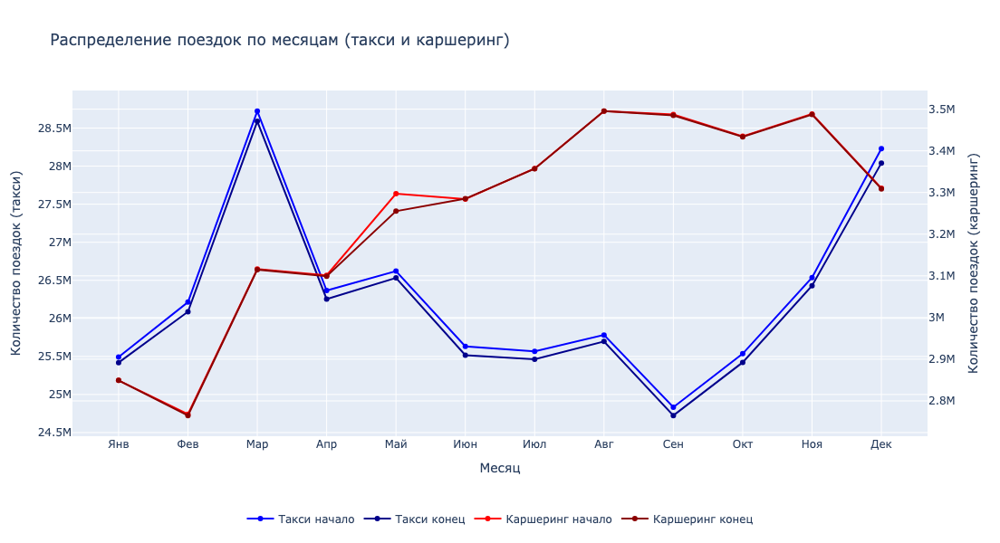

In [134]:
# Сгруппируем данные по номеру месяца
month_pivot = eda_df.pivot_table(index='month', # группируем по month
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                            }).reset_index()

plot_monthly_all_trips(month_pivot)

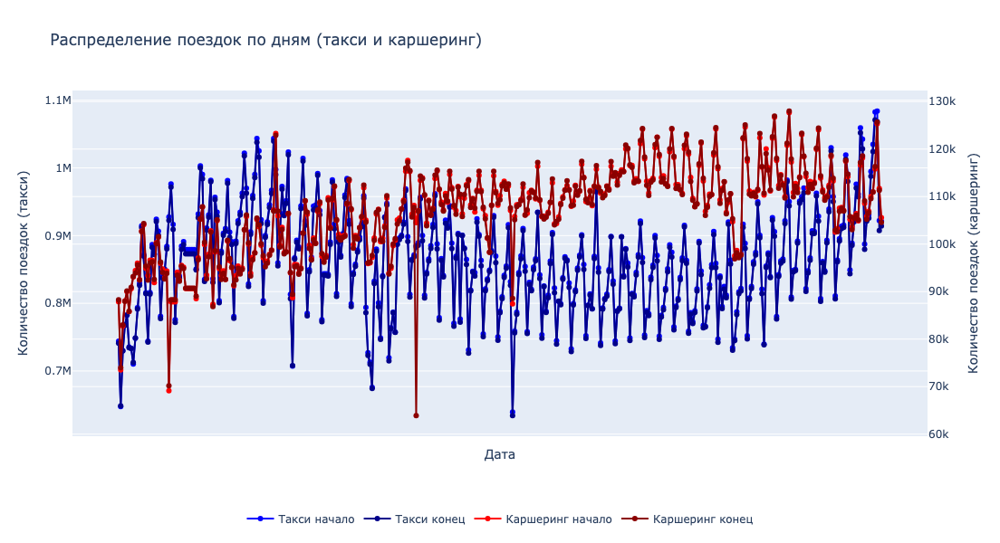

In [162]:
# Сгруппируем данные по дате
date_pivot = eda_df.pivot_table(index='date', # группируем по hour
                    values=['n_taxi_start', 
                            'n_taxi_end', 
                            'n_carsharing_start', 
                            'n_carsharing_end'],
                    aggfunc={'n_taxi_start': 'sum', # суммарное количество начатых поездок в такси
                             'n_taxi_end': 'sum', # суммарное количество законченных поездок в такси
                             'n_carsharing_start': 'sum', # суммарное количество начатых поездок в каршеринге
                             'n_carsharing_end': 'sum', # суммарное количество законченных поездок в каршеринге
                            }).reset_index()

plot_date_all_trips(date_pivot)

### Вывод по результатам описательного анализа данных

#### Такси 
- **Среднее количество начатых поездок** — 273, законченных — 272.
- **Максимальное количество начавшихся поездок за час**: `3 895` — **21 декабря в 2:00** (Тверской район).
- **Максимальное количество завершившихся поездок за час**: `4 519` — **28 августа в 14:00** (Тверской район).
- **Район с наибольшим количеством начатых поездок за год**: **Пресненский** (`10 396 833` поездок).
- **Район с наибольшим количеством завершившихся поездок**: **Пресненский** (`10 991 727` поездок).
- **Округ-лидер по активности такси**: **Центральный административный округ** — более **59.7 млн завершённых поездок** и **60.1 млн начатых**.

---

#### Каршеринг 
- **Среднее количество начатых и завершившихся поездок** — по 34.
- **Максимальное количество начатых поездок за час**: `301` — **19 марта в 16:00** (район Коммунарка).
- **Максимальное количество завершившихся поездок за час**: `305` — **7 июля в 12:00** (район Коммунарка).
- **Район с наибольшим количеством начатых поездок**: **район Коммунарка** (`840 424` поездки).
- **Район с наибольшим количеством завершённых поездок**: **Пресненский район** (`852 684`).
- **Округ-лидер по каршерингу**: **Западный административный округ** (начато: `5.1 млн`, завершено: `4.9 млн`).

---

#### Временные паттерны 

##### По часам суток:
- **Пиковые часы** для такси: с **8:00 до 20:00**, особенно в **вечерний час-пик (17:00–19:00)**.
- **Каршеринг** активнее используется **в вечерние часы**, максимум — в **19:00 (2.7 млн завершённых поездок)**.

##### По дням недели:
- **Наибольшая активность** наблюдается в **пятницу** наблюдается для такси, в **субботу** для каршеринга.
- **Минимум** по числу поездок в такси— **вторник-воскресенье**, на каршеринге в **среду - четверг**

##### По месяцам:
- **Наибольшая активность** в летние месяцы — **июль, август, сентябрь**, что может быть связано с увеличением числа поездок в период отпусков.
- **Меньше всего поездок** фиксируется в **январе и феврале**, что характерно для постновогоднего периода.

---

#### Географическое распределение 
- В **Новомосковском округе** — всего **2 района**, в то время как в **Северо-Восточном** — **17 районов**.
- Лидеры по числу поездок (такси и каршеринг) — районы, относящиеся к **Центральному** и **Западному округам**.

---

#### Выводы:
- Активность такси и каршеринга существенно варьируется во времени и пространстве.
- Центральные районы и часы пик (утром и вечером) демонстрируют наибольшую нагрузку на транспортные сервисы.
- **Коммунарка** и **Пресненский район** — ключевые точки активности каршеринга и такси.


<h2 style="color: navy;"> 2.4. Поиск и обработка выбросов</h2>

In [165]:
df_daily = eda_df.groupby('date').agg({'n_taxi_start': 'sum',
                                 'n_taxi_end': 'sum',
                                 'n_carsharing_start': 'sum',
                                 'n_carsharing_end': 'sum',})

In [168]:
df_weekly = eda_df.groupby('week_number').agg({'n_taxi_start': 'sum',
                                 'n_taxi_end': 'sum',
                                 'n_carsharing_start': 'sum',
                                 'n_carsharing_end': 'sum',})

In [169]:
df_monthly = eda_df.groupby('month').agg({'n_taxi_start': 'sum',
                                 'n_taxi_end': 'sum',
                                 'n_carsharing_start': 'sum',
                                 'n_carsharing_end': 'sum',})

In [172]:
def plot_violin_trip_distribution(df, start_col, end_col, title_prefix='Такси', agg_column='timestamp'):
    """
    Строит один Violin plot для стартов и завершений поездок по часам.

    Параметры:
    df (DataFrame): Датафрейм с колонкой 'timestamp' и метриками поездок.
    start_col (str): Название столбца со стартами поездок.
    end_col (str): Название столбца с окончаниями поездок.
    title_prefix (str): Текст в заголовке, например "Такси" или "Каршеринг".
    """

    # Агрегация по timestamp
    hourly_agg = df.groupby(agg_column)[[start_col, end_col]].sum().reset_index()

    # Преобразуем в "long format" для одного общего Violin plot
    melted_df = hourly_agg.melt(
        value_vars=[start_col, end_col],
        var_name='Тип поездки',
        value_name='Количество поездок'
    )

    fig = px.violin(
        melted_df,
        y='Количество поездок',
        x='Тип поездки',
        color='Тип поездки',
        box=True,  # добавить boxplot внутри
        points='all',  # показать все точки
        hover_data=melted_df.columns
    )

    fig.update_traces(
        meanline_visible=True,
        scalemode='count'
    )

    fig.update_layout(
        title_text=f'Violin plot распределения количества поездок: {title_prefix}',
        width=800,
        height=600,
        violingap=0.2,
        violinmode='group'
    )

    return fig


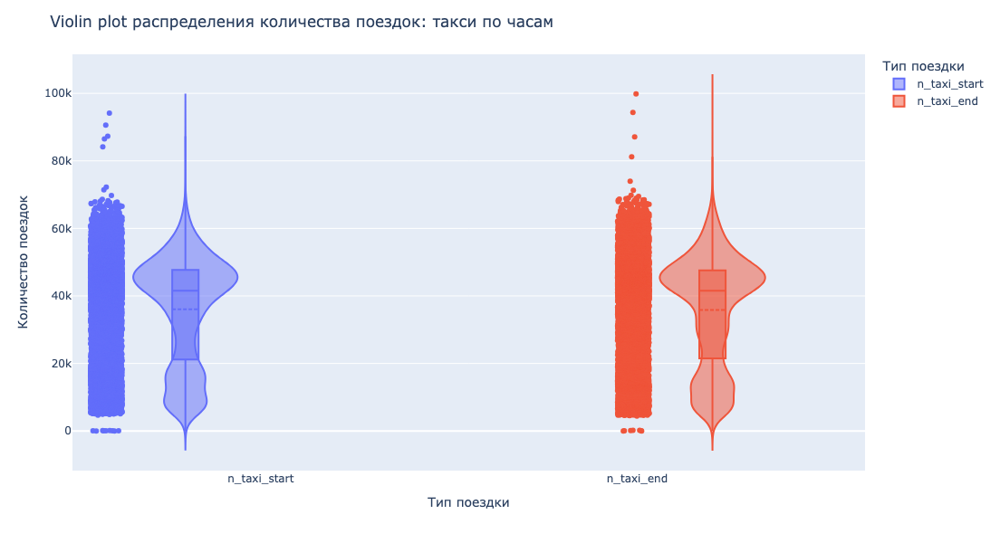

In [174]:
fig = plot_violin_trip_distribution(eda_df, 'n_taxi_start', 'n_taxi_end', title_prefix='такси по часам')
fig.show()

In [175]:
fig = plot_violin_trip_distribution(df_daily, 'n_taxi_start', 'n_taxi_end', title_prefix='такси по дням', agg_column='date')
fig.show()

In [176]:
fig = plot_violin_trip_distribution(df_weekly, 'n_taxi_start', 'n_taxi_end', title_prefix='такси по неделям', agg_column='week_number')
fig.show()

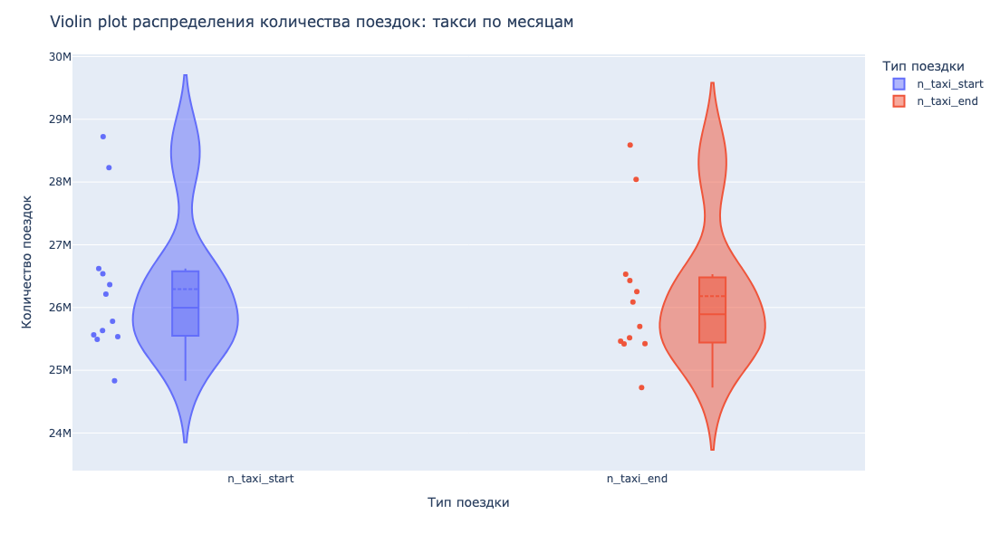

In [177]:
fig = plot_violin_trip_distribution(df_monthly, 'n_taxi_start', 'n_taxi_end', title_prefix='такси по месяцам', agg_column='month')
fig.show()

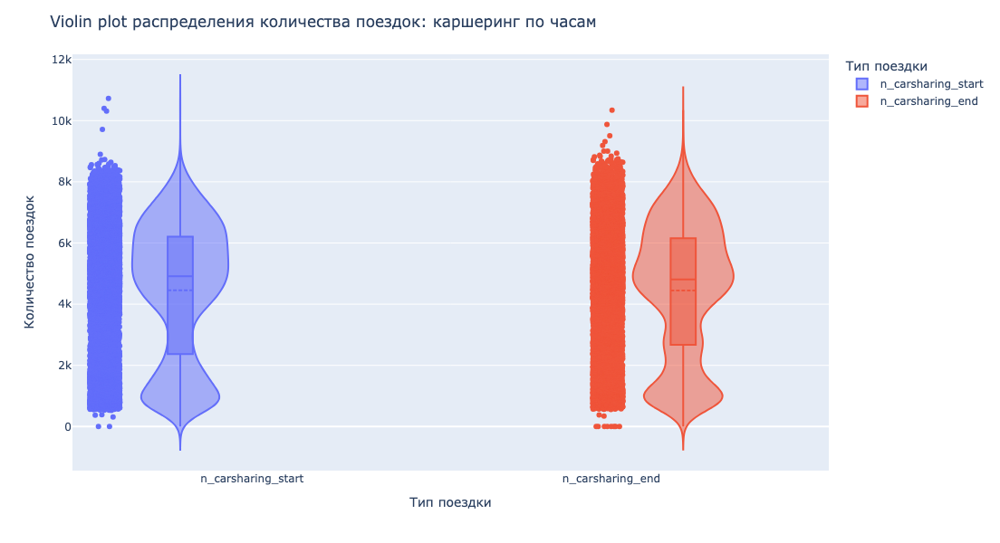

In [178]:
fig = plot_violin_trip_distribution(eda_df, 'n_carsharing_start', 'n_carsharing_end', title_prefix='каршеринг по часам')
fig.show()

In [183]:
fig = plot_violin_trip_distribution(df_daily, 'n_carsharing_start', 'n_carsharing_end', title_prefix='каршеринг по дням', agg_column='date')
fig.show()

In [184]:
fig = plot_violin_trip_distribution(df_weekly, 'n_carsharing_start', 'n_carsharing_end', title_prefix='каршеринг по неделям', agg_column='week_number')
fig.show()

In [185]:
fig = plot_violin_trip_distribution(df_monthly, 'n_carsharing_start', 'n_carsharing_end', title_prefix='каршеринг по месяцам', agg_column='month')
fig.show()

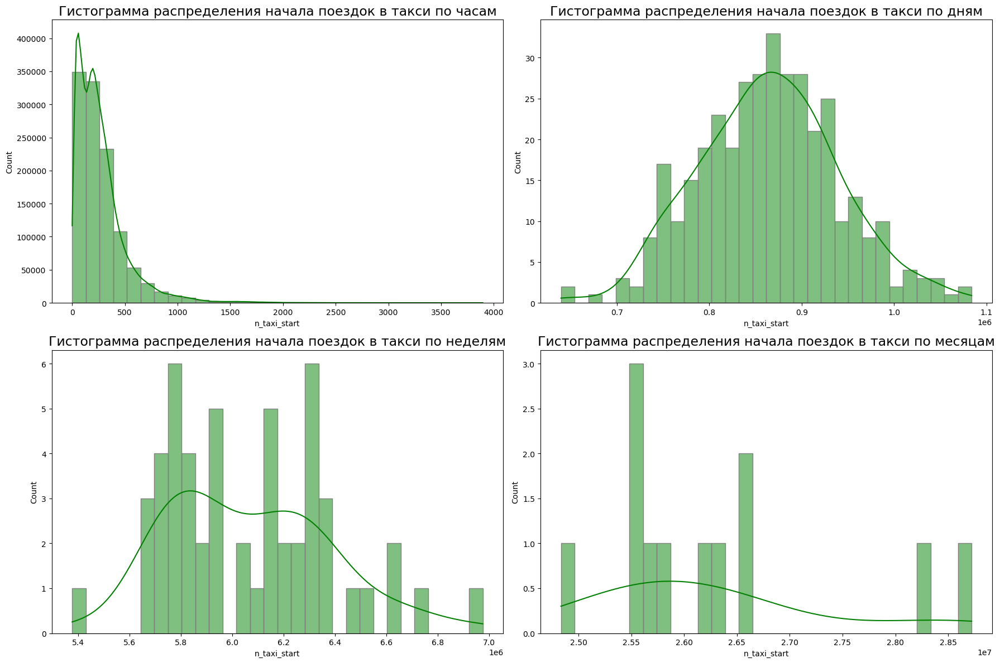

In [186]:
plt.figure(figsize=(18, 12))

plt.subplot(2, 2, 1)
sns.histplot(eda_df.n_taxi_start, bins=30, color='green', edgecolor='gray', kde=True)
plt.title('Гистограмма распределения начала поездок в такси по часам', fontsize=17)

plt.subplot(2, 2, 2)
sns.histplot(df_daily.n_taxi_start, bins=30, color='green', edgecolor='gray', kde=True)
plt.title('Гистограмма распределения начала поездок в такси по дням', fontsize=17)

plt.subplot(2, 2, 3)
sns.histplot(df_weekly.n_taxi_start, bins=30, color='green', edgecolor='gray', kde=True)
plt.title('Гистограмма распределения начала поездок в такси по неделям', fontsize=17)

plt.subplot(2, 2, 4)
sns.histplot(df_monthly.n_taxi_start, bins=30, color='green', edgecolor='gray', kde=True)
plt.title('Гистограмма распределения начала поездок в такси по месяцам', fontsize=17)

plt.tight_layout()
plt.show()

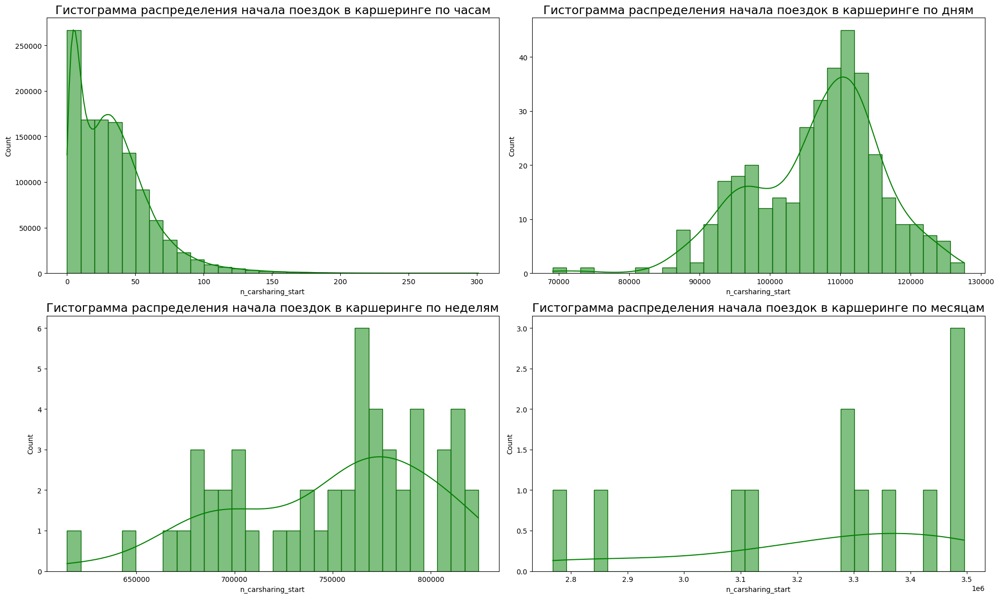

In [187]:
plt.figure(figsize=(20, 12))

plt.subplot(2, 2, 1)
sns.histplot(eda_df.n_carsharing_start, bins=30, color='green', edgecolor='darkgreen', kde=True)
plt.title('Гистограмма распределения начала поездок в каршеринге по часам', fontsize=17)

plt.subplot(2, 2, 2)
sns.histplot(df_daily.n_carsharing_start, bins=30, color='green', edgecolor='darkgreen', kde=True)
plt.title('Гистограмма распределения начала поездок в каршеринге по дням', fontsize=17)

plt.subplot(2, 2, 3)
sns.histplot(df_weekly.n_carsharing_start, bins=30, color='green', edgecolor='darkgreen', kde=True)
plt.title('Гистограмма распределения начала поездок в каршеринге по неделям', fontsize=17)

plt.subplot(2, 2, 4)
sns.histplot(df_monthly.n_carsharing_start, bins=30, color='green', edgecolor='darkgreen', kde=True)
plt.title('Гистограмма распределения начала поездок в каршеринге по месяцам', fontsize=17)

plt.tight_layout()
plt.show()


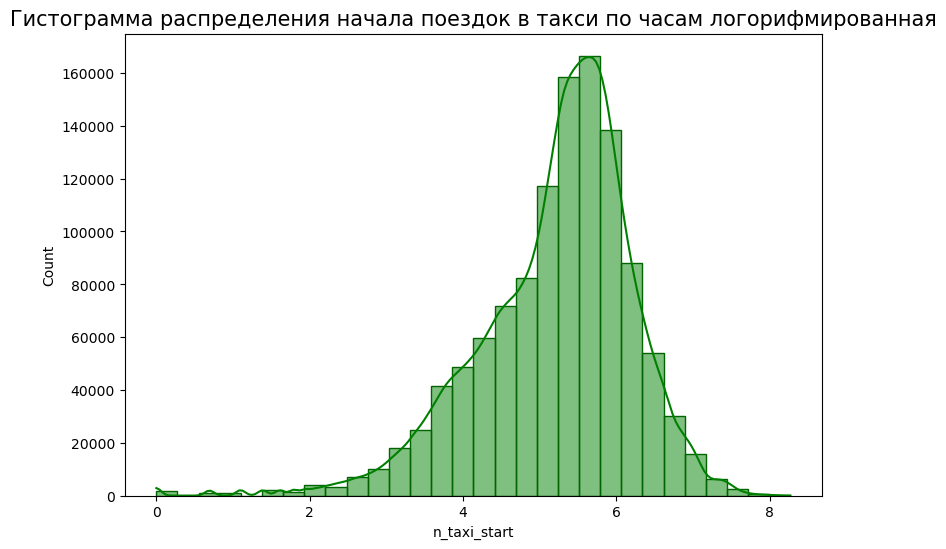

In [189]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('Гистограмма распределения начала поездок в такси по часам логорифмированная', fontsize=15)
sns.histplot(np.log1p(eda_df.n_taxi_start),
             bins=30,
             ax=ax,
             color='green',
             edgecolor='darkgreen',
             kde=True
            );

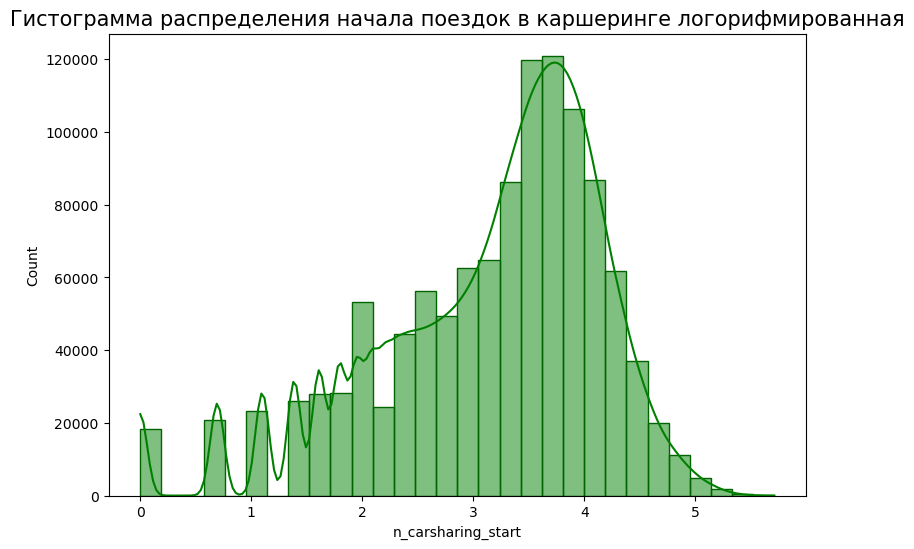

In [193]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('Гистограмма распределения начала поездок в каршеринге логорифмированная', fontsize=15)
sns.histplot(np.log1p(eda_df.n_carsharing_start),
             bins=30,
             ax=ax,
             color='green',
             edgecolor='darkgreen',
             kde=True
            );

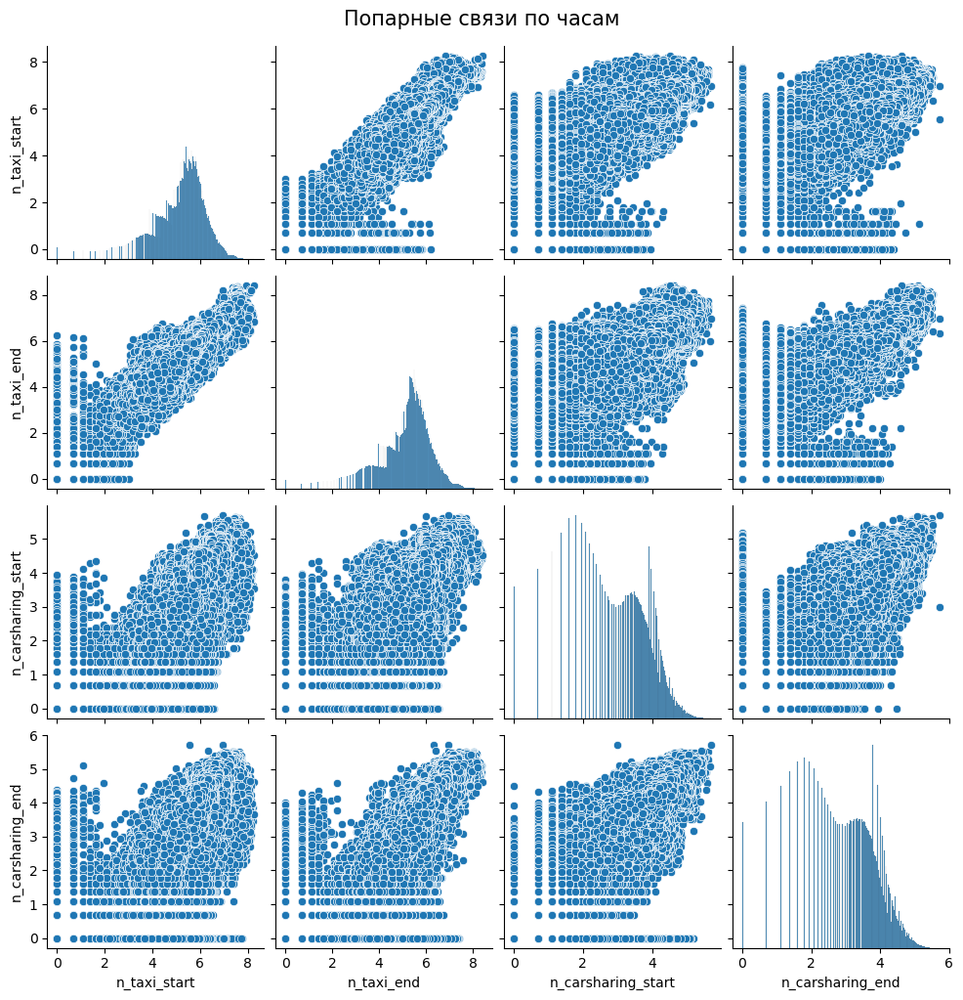

In [194]:
sns.pairplot(np.log1p(eda_df[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']]))
plt.suptitle('Попарные связи по часам', fontsize=15, y=1.02)
plt.show()

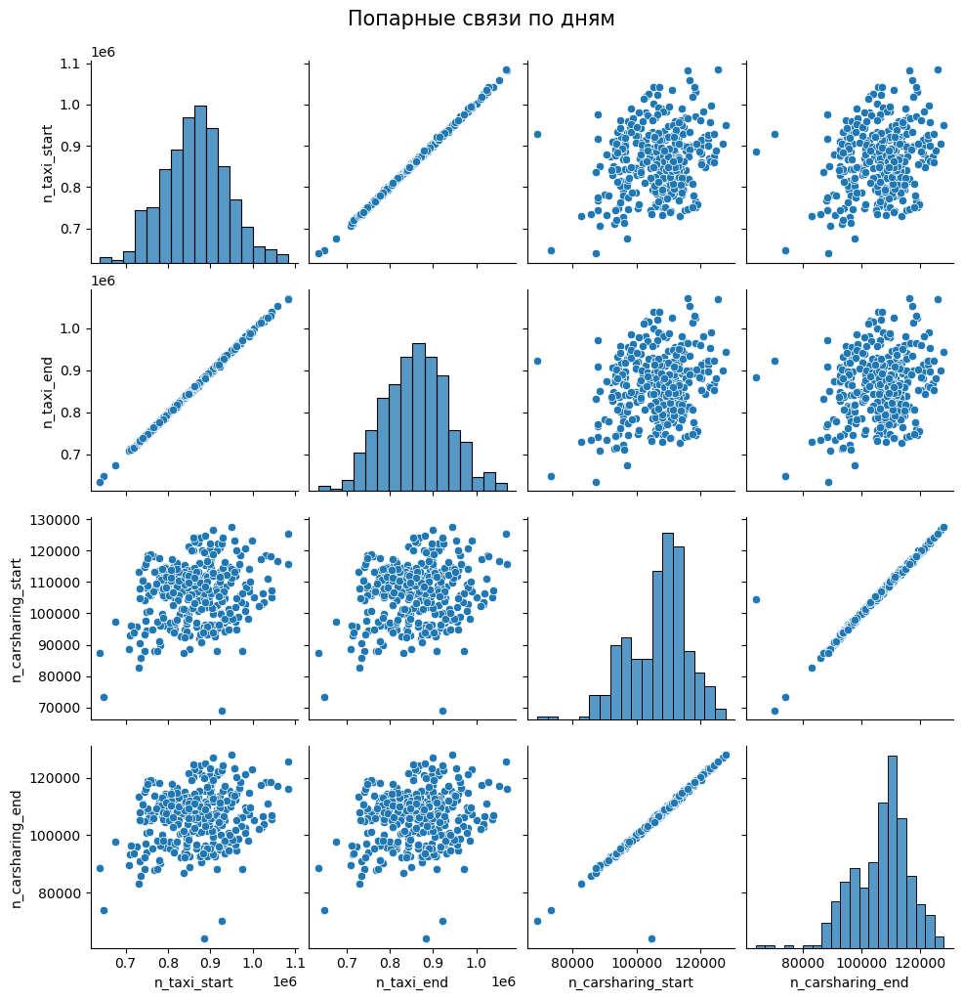

In [195]:
sns.pairplot(df_daily[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']])
plt.suptitle('Попарные связи по дням', fontsize=15, y=1.02)
plt.show()

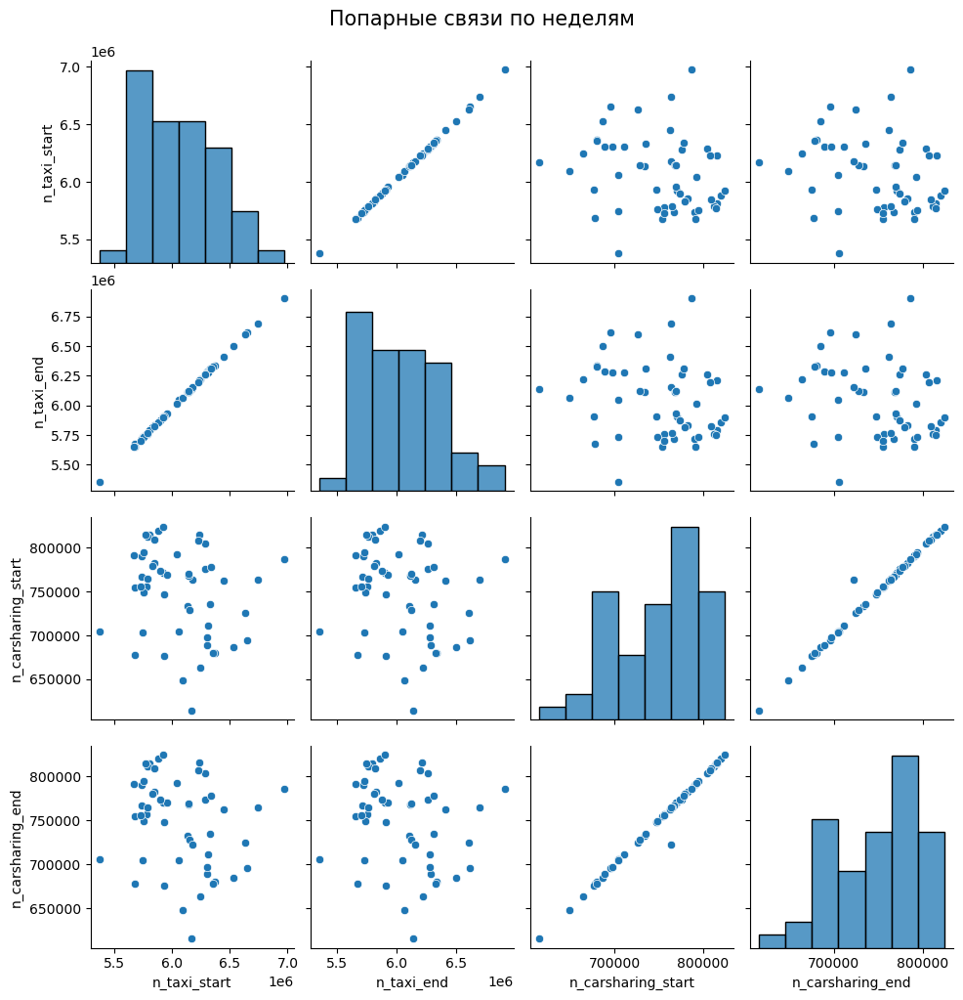

In [196]:
sns.pairplot(df_weekly[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']]);
plt.suptitle('Попарные связи по неделям', fontsize=15, y=1.02)
plt.show()

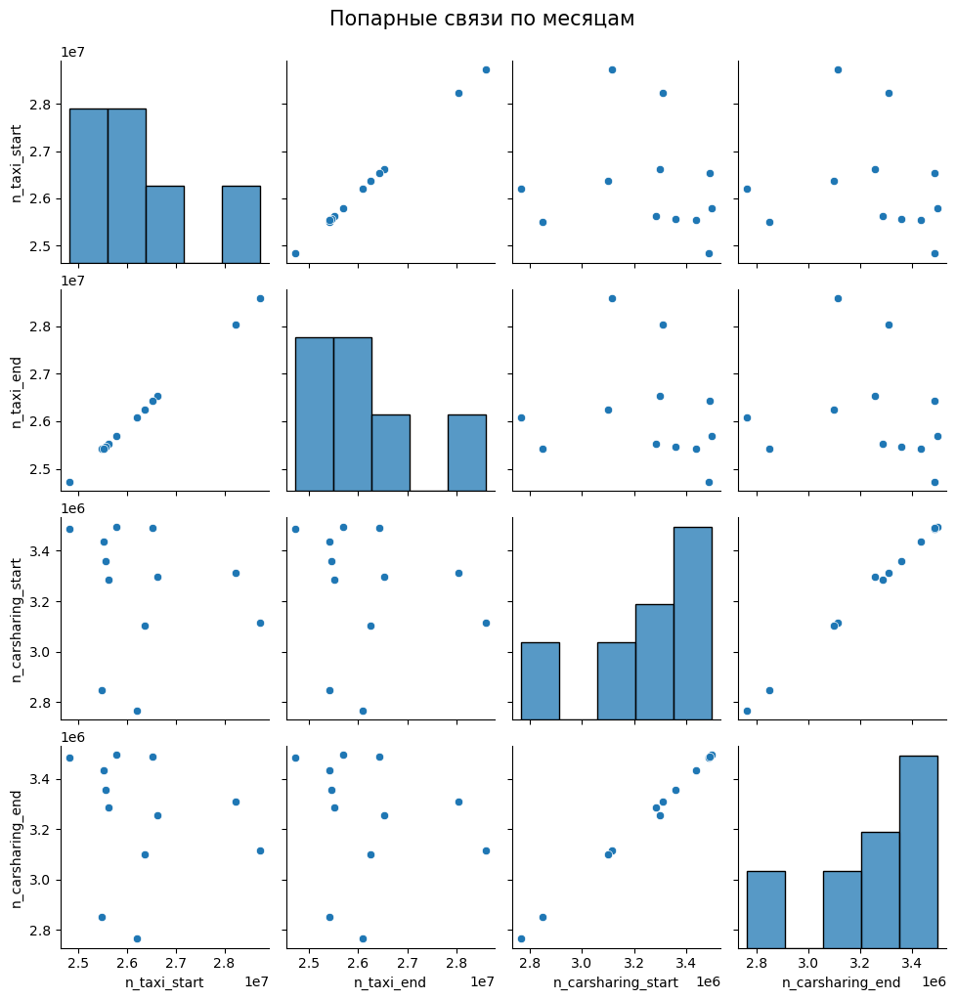

In [197]:
sns.pairplot(df_monthly[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']])
plt.suptitle('Попарные связи по месяцам', fontsize=15, y=1.02)
plt.show()

### Вывод по анализу распределения количества поездок в такси и каршеринге

В ходе предварительного анализа данных была выявлена **линейная зависимость** между количеством поездок в такси и количеством поездок в каршеринге. Это может свидетельствовать о том, что оба вида транспорта подчиняются схожим паттернам поведения пользователей — например, оба пиково используются в часы повышенного спроса (утром и вечером), и оба менее востребованы ночью. Такая взаимосвязь вполне логична, учитывая, что и такси, и каршеринг относятся к персональному транспорту по требованию.

#### Анализ распределений по временным интервалам

##### Почасовое распределение

На почасовом графике поездок в такси чётко видны **циклические суточные пики**:

- **Утренние пики** (~8:00–9:00);
- **Вечерние пики** (~17:00–19:00);
- **Минимум** активности — в **ночные часы** (0:00–5:00), где значения могут опускаться до **0 поездок**;
- **Пиковые значения** достигают **до 94,135 поездок в час**;
- Примерный диапазон "типичной активности" — от **18,000 до 47,000** поездок в час.

В каршеринге:
- **Медиана**: 4,912.5.
- **Нулевые значения**: Наблюдаются в ночные часы.  
- **Рекомендация**: Логарифмирование для анализа.

Это указывает на стабильность активности на дневном уровне. Колебания, вызванные внешними факторами (например, погодой, событиями), сглаживаются, и поведение пользователей становится **предсказуемым**. Такие данные можно использовать в моделях прогнозирования **временных рядов** без трансформаций.

Это подчёркивает выраженный **циркадный ритм** в пользовательском поведении, который следует учитывать при построении моделей прогнозирования и оптимизации ресурсного распределения (например, планирования парка машин).


Наиболее интересным оказалось распределение количества поездок **по часам**. Оно имеет ярко выраженный сдвиг к нулю, особенно в ночное время. В некоторых районах Москвы в определённые часы (например, после полуночи до 5 утра) количество поездок может быть нулевым. Это приводит к асимметрии и смещению распределения влево, что делает его далеким от нормального. 

В связи с этим было принято решение **применить логарифмирование** данных, чтобы:

- снизить влияние нулевых и экстремально низких значений;
- получить более симметричное распределение;
- облегчить последующее моделирование и визуализацию.

Также стоит отметить, что **биполярность активности** по районам столицы играет важную роль: в центральных и деловых районах спрос сохраняется даже в ночное время, в то время как в спальных и окраинных районах наблюдаются длинные периоды полной тишины. Это ещё больше усиливает асимметрию.

##### Распределения по дням

На дневном графике поездок в такси:

- **Минимум**: **639,521** поездок;
- **Максимум**: **1,083,859**;
- **Медиана**: **864,981**;
- **Среднее значение**: **864,460**;
- Распределение **близко к нормальному**.
  
В каршеринге:
- **Медиана**: 108.3 тыс.
- **Разброс**: 69.1 тыс. (min) – 127.6 тыс. (max).  

Распределение количества поездок **по дням** оказалось намного ближе к нормальному. Вероятно, это связано с тем, что на суточном уровне случайные колебания (например, погодные условия, выходные и праздники) сглаживаются, и количество поездок подчиняется более устойчивым закономерностям. Это позволяет использовать такие данные для временных рядов и прогнозирования без предварительных трансформаций.

##### Распределения по неделям и месяцам


На графике с распределением количества поездок в такси (по неделям):

- **Минимум**: **5,377,567**;
- **Максимум**: **6,974,526**;
- **Медиана**: **6,050,866**;
- **Среднее**: **6,067,850**;
- Наблюдается **умеренная асимметрия**, хотя распределение более сглажено.

Каршеринг:
- **Медиана**: 3.30 млн.
- **Разброс**: 2.77 млн. (min) – 3.50 млн. (max).  
- **Вывод**: Стабильный спрос с небольшими сезонными колебаниями.

**недельное и месячное распределение** демонстрируют более выраженную ненормальность. Возможные причины:

- Праздничные и выходные недели, которые значительно выбиваются по уровню активности;
- Сезонность (например, летом — рост числа поездок, зимой — снижение);
- Наличие выбросов — хотя они и не критичны (все лежат в пределах трёх сигм), но в совокупности искажают форму распределения.

#### Наличие повторяющихся суточных паттернов

Особое внимание стоит уделить **чётко выраженным суточным паттернам поведения** пользователей. Они проявляются в виде пиков и спадов активности в течение суток:

- **Утренние и вечерние пики** — соответствуют времени поездок на работу и с работы;
- **Небольшой подъём днём** — скорее всего, отражает поездки на обед или встречи;
- **Ночное падение спроса** — естественное явление, когда большинство пользователей отдыхают и количество поездок минимально.

Такой характер распределения подтверждает, что пользовательское поведение в течение суток повторяется с высокой степенью стабильности. Это даёт возможность использовать модели, ориентированные на **циркадные ритмы**, и строить прогнозы на основе типичного поведения по часам суток.

#### Выводы

1. Распределения по часам требуют трансформации из-за смещения и наличия нулевых значений.
2. Дневные данные приближаются к нормальному распределению и удобны для статистического анализа.
3. В данных есть выбросы, но они укладываются в статистические границы (±3σ).
4. Поведение пользователей демонстрирует чёткую цикличность, особенно в рамках суток.
5. Пространственные различия (между районами) и временные факторы (день недели, сезон) важно учитывать в дальнейшей аналитике и моделировании.


<h2 style="color: navy;"> 2.5. Корреляционный анализ</h2>

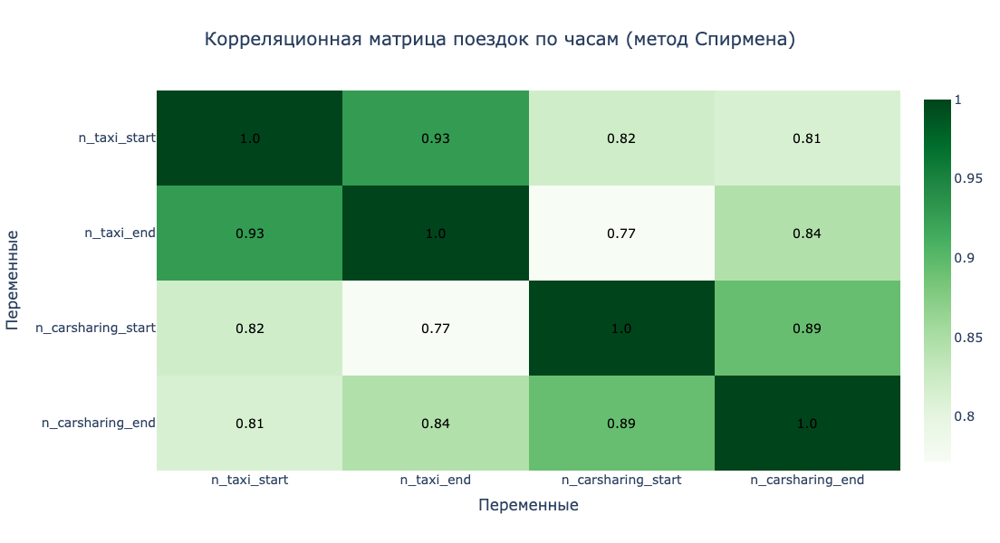

In [201]:
corr_hourly_matrix = eda_df[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']].corr(method='spearman')

corr_matrix_flipped = corr_hourly_matrix.iloc[::-1]
z_text_flipped = np.round(corr_matrix_flipped.values, 2).astype(str)

z_min = corr_hourly_matrix.values.min()
z_max = corr_hourly_matrix.values.max()

# Строим график
fig = go.Figure(data=go.Heatmap(
    z=corr_matrix_flipped.values,
    x=corr_hourly_matrix.columns,
    y=corr_matrix_flipped.index,
    colorscale='Greens',
    zmin=z_min,
    zmax=z_max,
    text=z_text_flipped,
    texttemplate="%{text}",
    textfont={"size":14, "color":"black"},
    showscale=True
))

fig.update_layout(
    title='Корреляционная матрица поездок по часам (метод Спирмена)',
    title_x=0.5,
    width=800,
    height=600,
    xaxis_title='Переменные',
    yaxis_title='Переменные',
    font=dict(size=14)
)

fig.show()


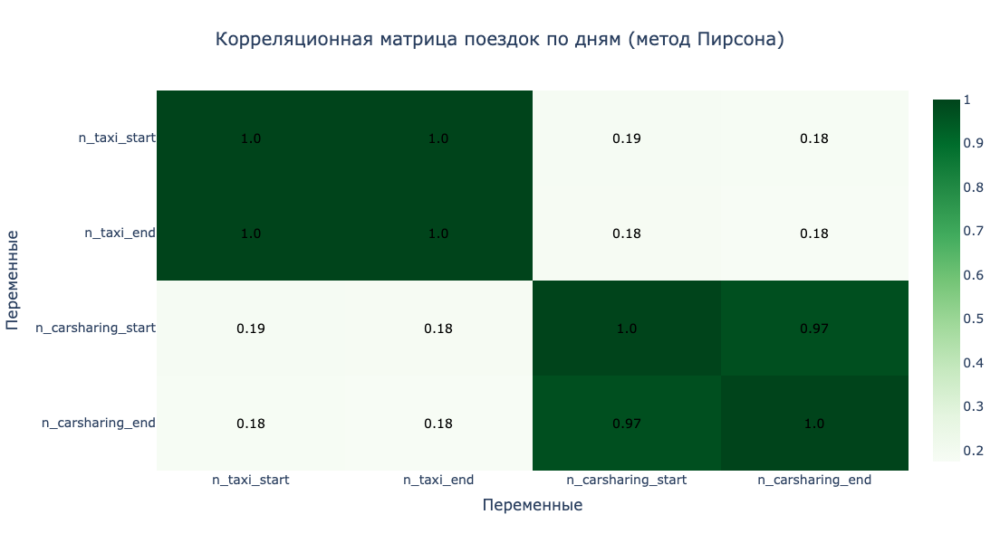

In [203]:
corr_daily_matrix = df_daily[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']].corr(method='pearson')

corr_matrix_flipped = corr_daily_matrix.iloc[::-1]
z_text_flipped = np.round(corr_matrix_flipped.values, 2).astype(str)

# Строим график
fig = go.Figure(data=go.Heatmap(
    z=corr_matrix_flipped.values,
    x=corr_daily_matrix.columns,
    y=corr_matrix_flipped.index,
    colorscale='Greens',
    text=z_text_flipped,
    texttemplate="%{text}",
    textfont={"size":14, "color":"black"},
    showscale=True
))

fig.update_layout(
    title='Корреляционная матрица поездок по дням (метод Пирсона)',
    title_x=0.5,
    width=800,
    height=600,
    xaxis_title='Переменные',
    yaxis_title='Переменные',
    font=dict(size=14)
)

fig.show()


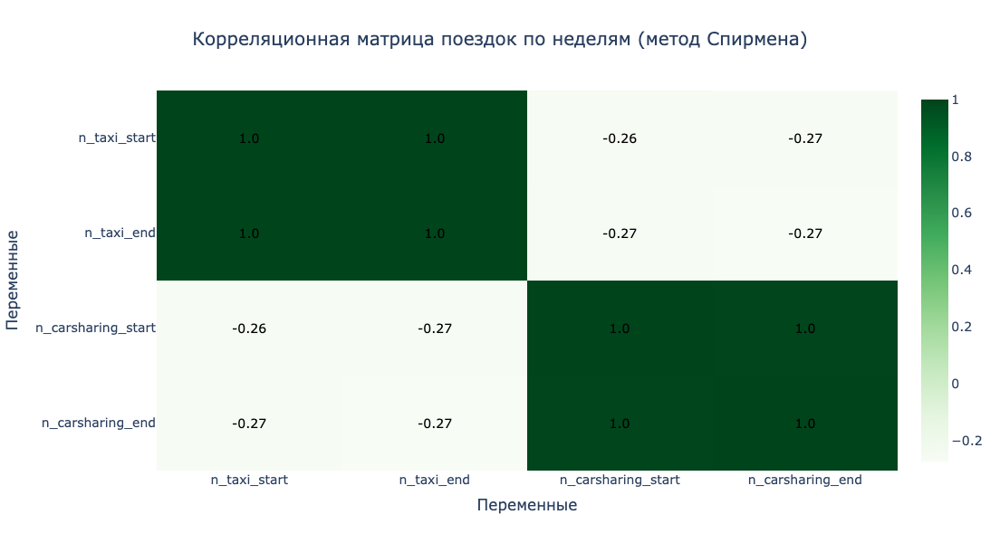

In [205]:
corr_weekly_matrix = df_weekly[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']].corr(method='spearman')

corr_matrix_flipped = corr_weekly_matrix.iloc[::-1]
z_text_flipped = np.round(corr_matrix_flipped.values, 2).astype(str)

# Строим график
fig = go.Figure(data=go.Heatmap(
    z=corr_matrix_flipped.values,
    x=corr_weekly_matrix.columns,
    y=corr_matrix_flipped.index,
    colorscale='Greens',
    text=z_text_flipped,
    texttemplate="%{text}",
    textfont={"size":14, "color":"black"},
    showscale=True
))

fig.update_layout(
    title='Корреляционная матрица поездок по неделям (метод Спирмена)',
    title_x=0.5,
    width=800,
    height=600,
    xaxis_title='Переменные',
    yaxis_title='Переменные',
    font=dict(size=14)
)

fig.show()


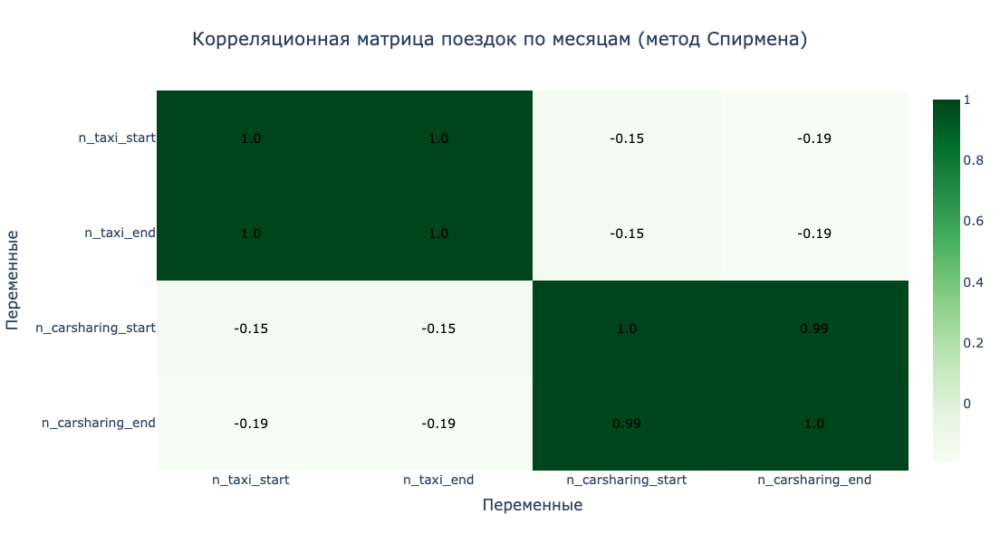

In [207]:
corr_monthly_matrix = df_monthly[['n_taxi_start','n_taxi_end', 'n_carsharing_start', 'n_carsharing_end']].corr(method='spearman')

corr_matrix_flipped = corr_monthly_matrix.iloc[::-1]
z_text_flipped = np.round(corr_matrix_flipped.values, 2).astype(str)

# Строим график
fig = go.Figure(data=go.Heatmap(
    z=corr_matrix_flipped.values,
    x=corr_monthly_matrix.columns,
    y=corr_matrix_flipped.index,
    colorscale='Greens',
    text=z_text_flipped,
    texttemplate="%{text}",
    textfont={"size":14, "color":"black"},
    showscale=True
))

fig.update_layout(
    title='Корреляционная матрица поездок по месяцам (метод Спирмена)',
    title_x=0.5,
    width=800,
    height=600,
    xaxis_title='Переменные',
    yaxis_title='Переменные',
    font=dict(size=14)
)

fig.show()


### Вывод о поведении корреляции между поездками такси и каршеринга при разной агрегации по времени

На основании анализа корреляционных матриц можно сделать следующие наблюдения и выводы относительно взаимосвязи между количеством поездок в такси и каршеринге:

#### 1. **Почасовая корреляция (с 0.7 по 0.8):**
Корреляция между такси и каршерингом по часам является **высокой и положительной**, что говорит о схожем поведении спроса в рамках суток. Это отражает наличие устойчивых **суточных паттернов**, таких как:
- Утренние и вечерние пики (поездки на работу и с работы);
- Дневные умеренные повышения (поездки по делам, на обед и т.д.);
- Ночные спады (снижение активности в 1:00–5:00).

Обе услуги (такси и каршеринг) реагируют на **одинаковую структуру поведения горожан**, что объясняет сильную синхронность активности в течение суток.

#### 2. **Агрегация по дням (с 0.18 по 0.19):**
После агрегирования данных по дням корреляция **резко ослабевает**. Это указывает на то, что **краткосрочные колебания** и локальные пики сглаживаются, а **долгосрочная динамика** у двух сервисов начинает отличаться.

Причины ослабления:
- Услуги такси и каршеринга могут по-разному реагировать на **внешние события** (погода, праздники, пробки);
- Различия в стратегии использования: такси более востребовано в плохую погоду или ночью, тогда как каршеринг — больше днём и при хороших условиях;
- Суммирование по дням **сглаживает внутрисуточные пики**, где и наблюдалась основная синхронность.

#### 3. **Агрегация по неделям (с –0.26 по –0.27):**
На недельном уровне корреляция становится **отрицательной**, что может указывать на **противоположные тренды**. Это может происходить из-за:
- **Конкуренции между сервисами**: рост активности одного может сопровождаться снижением другого;
- **Нерегулярного распределения спроса**: например, в выходные пользователи могут предпочесть каршеринг для выезда за город, а в будни — такси для работы;

#### 4. **Агрегация по месяцам (с –0.15 по –0.19):**
На месячном уровне корреляция остаётся **слабой и отрицательной**. Это объясняется тем, что:
- **Количество точек наблюдений всего 12**, и этого недостаточно для устойчивых статистических выводов;
- Поведение пользователей на месячном уровне подвержено влиянию **сезонных факторов**, изменений в ценовой политике, акций, доступности автомобилей и т.д.;
- Агрегация на этом уровне **теряет поведенческие паттерны**, чётко видимые только на почасовой/посуточной детализации.

---

### Общий вывод:
Сильная корреляция между количеством поездок в такси и каршеринге наблюдается только при **высокой временной детализации** (по часам), где ярко выражены поведенческие паттерны. При укрупнении временных интервалов зависимость между сервисами ослабевает или становится отрицательной, что отражает различия в **макротенденциях**, **спросе** и **сценариях использования** двух типов транспортных услуг.

Таким образом, **взаимосвязь между такси и каршерингом носит поведенческий и краткосрочный характер**, но **на долгосрочном уровне поведение пользователей существенно расходится**.


<h2 style="color: navy;"> 2.6. Визуализация поездок по административным округам</h2>

In [209]:
def plot_choropleth_okrugs(df, geojson_data, metric_column, 
                          okrug_column='administrative_region',
                          title='', tooltip=''):
    
    gdf = gpd.GeoDataFrame.from_features(geojson_data['features'])
    gdf = gdf.set_crs("EPSG:4326")
    
    district_to_okrug = eda_df[['district_name', 'administrative_region']].drop_duplicates()
    gdf = gdf.merge(
        district_to_okrug, 
        left_on='name', 
        right_on='district_name',
        how='left'
    )
    
    gdf_okrugs = gdf.dissolve(by='administrative_region').reset_index()
    
    if gdf_okrugs.crs is None:
        gdf_okrugs = gdf_okrugs.set_crs("EPSG:4326")
    gdf_okrugs = gdf_okrugs.to_crs("EPSG:4326")

    gdf_okrugs = gdf_okrugs.merge(df[[okrug_column, metric_column]], on=okrug_column, how='left')
    
    m = folium.Map(location=[55.75, 37.61], 
                   zoom_start=10, 
                   tiles='CartoDB positron'
                  )
    
    Choropleth(
        geo_data=gdf_okrugs.__geo_interface__,
        data=df,
        columns=[okrug_column, metric_column],
        key_on=f'feature.properties.{okrug_column}',
        fill_color='YlOrRd',
        legend_name=f'{metric_column} по округам'
    ).add_to(m)

    folium.GeoJson(
        gdf_okrugs,
        style_function=lambda feature: {
            "fillColor": "transparent",
            "color": "black",
            "weight": 1,
            "fillOpacity": 0
        },
        tooltip=folium.GeoJsonTooltip(
        fields=[okrug_column, metric_column],
        aliases=['Округ', tooltip],
        localize=True,
        sticky=False
        )
    ).add_to(m)
    
    if title:
        title_html = f'''
            <h3 align="center" style="font-size:16px"><b>{title}</b></h3>
        '''
        m.get_root().html.add_child(folium.Element(title_html))
    
    return m


In [211]:
okrug_pivot = eda_df.pivot_table(
    index='administrative_region',
    values=['n_taxi_start', 'n_taxi_end', 'n_carsharing_start', 'n_carsharing_end'],
    aggfunc='sum'
).reset_index()

In [213]:
map_taxi = plot_choropleth_okrugs(
    df=okrug_pivot,
    geojson_data=msc_borders_clean,
    metric_column='n_taxi_start',
    title='Поездки на такси по округам Москвы',
    tooltip='Количество поездок'
)
map_taxi

In [215]:
map_carsharing = plot_choropleth_okrugs(
    df=okrug_pivot,
    geojson_data=msc_borders_clean,
    metric_column='n_carsharing_start',
    title='Поездки на каршеринге по округам Москвы',
    tooltip='Количество поездок'
)
map_carsharing

### Анализ распределения поездок на такси и каршеринге по административным округам Москвы

На двух представленных картах визуализированы данные по количеству поездок на **каршеринге** и **такси** в различных административных округах Москвы. Цветовая шкала отражает интенсивность поездок: от светло-жёлтого (наименьшее количество) до тёмно-красного (наибольшее количество).

#### Основные наблюдения:

##### 1. **Центральный административный округ (ЦАО):**
- **Каршеринг:** Каршеринг менее востребован в центральном округе чем в других: Южный, Юго-Восточный и Западный
- **Такси:** Один из лидеров по количеству поездок. Округ окрашен в тёмно-красный цвет, что говорит о высокой популярности каршеринга.
- 
**Вывод:** Центральный округ — ключевая зона транспортной активности, где пользователи активно пользуются обоими видами транспорта, тем не менее, машину каршеринга здесь достаточно сложно найти из-за нехватки парковочных мест чтобы удовлетворить повышенный спрос, поэтому люди выбирают альтернативный вид транспорта - такси

##### 2. **Северный, Северо-Восточный, Восточный округа:**
- **Каршеринг:** Значительно более востребованы, округ окрашен в насыщенно-оранжевый цвет. 
- **Такси:** Эти округа тоже достаточно активны, но уступают по насыщенности цвета ЦАО.

**Вывод:** В данных округах наблюдается баланс между использованием такси и каршеринга, но всё же с некоторым уклоном в сторону каршеринга (поскольку цветовая насыщенность выше для каршеринга).

##### 3. **Западный, Южный и Юго-Восточный округа:**
- **Каршеринг:** Эти округа имеют наивысший уровень использования каршеринга (красный цвет).
- **Такси:** Значительно менее востребованы по сравнению с каршерингом, округ окрашен в оранжевый цвет.

**Вывод:** В южных округах Москвы жители предпочитают каршеринг такси, возможно из-за экономико-социальных факторов, хорошая идея для гипотезы.

##### 4. **Троицкий и Новомосковский административные округа (ТиНАО):**
- **Каршеринг:** - Хоть и окрашены в бледные цвета, объёмы поездок на каршеринге в новомосковском оранжевого цвета.
- **Такси:** Минимальный уровень использования — бледно-жёлтые тона.

**Вывод:** В Троицком округе Москвы использование каршеринга практически отсутствует, но такси остаётся востребованным, вероятно, из-за удалённости от метро и из-за меньшего покрытия каршеринговыми сервиса, в Новомосковском каршерингом пользуются охотнее чем такси

#### Общие выводы:
- **Такси** остаётся более универсальным и популярным видом транспорта, особенно в центральных округах.
- **Каршеринг** наиболее развит и востребован в близлежащих округах, что может быть связано с плотностью населения, наличием парковок и зон допуска.

#### Инсайты:
- Увеличение числа каршеринговых машин в центральных и новых округах может поспособствовать более равномерному распределению поездок.
- Необходима инфраструктурная поддержка (парковки, льготы, доступность) для роста каршеринга в новых округах Москвы.
- Стоит провести дополнительное исследование причин низкой популярности каршеринга в южных округах и ТиНАО (возможно, экономические факторы или недостаточная информированность жителей).

<h2 style="color: navy;"> 2.7. Выводы и интерпретация результатов</h2>

### Итоговые выводы по проекту "Прогнозирование спроса на такси/каршеринг по районам Москвы"

### Основные результаты исследования

#### 1. Характеристика данных и предобработка
- Проанализирован датасет из **1 156 320 записей** с почасовой детализацией за 2024 год
- Выделено **25 ключевых признаков**, включая:
  - Транспортные метрики (поездки такси/каршеринг)
  - Временные факторы (час, день недели, сезон)
  - Погодные условия
  - Социально-экономические показатели районов
- Данные прошли полный цикл предобработки:
  - Проверка на пропуски и дубликаты
  - Корректное приведение типов данных
  - Добавление производных признаков (час пик, выходные и др.)

#### 2. Ключевые закономерности спроса

#### Временные паттерны:
- **Суточная динамика**:
  - Четкие пики в утренние (8:00-9:00) и вечерние (17:00-19:00) часы
  - Минимальная активность ночью (0:00-5:00)
- **Недельная динамика**:
  - Максимум спроса на такси в пятницу
  - Максимум спроса на каршеринг в субботу
- **Сезонность**:
  - Летние месяцы (июль-август) - период максимальной активности
  - Зимние месяцы (январь-февраль) - спад спроса

#### Географическое распределение:
- **Центральный округ**:
  - Абсолютный лидер по такси (60+ млн поездок)
  - Ограниченное использование каршеринга (проблемы с парковками)
- **Западный и Юго-Западный округа**:
  - Максимальная активность каршеринга
  - Сбалансированное использование с такси
- **ТиНАО**:
  - Доминирование такси в Троицком округе
  - Преимущество каршеринга в Новомосковском округе

#### 3. Корреляционный анализ
- **Высокая корреляция (0.7-0.8)** на почасовом уровне - общие поведенческие паттерны
- **Слабая/отрицательная корреляция** при агрегации по дням/неделям - разные долгосрочные тренды
- **Основные факторы влияния**:
  - Временные (час пик, выходные)
  - Погодные (осадки, температура)
  - Инфраструктурные (наличие станций метро)
  - Социально-экономические (стоимость жилья, плотность населения)

#### 4. Рекомендации для бизнеса
1. **Оптимизация парка транспортных средств**:
   - Увеличение количества машин каршеринга в Южных и Новомосковском округах
   - Концентрация такси в ЦАО в часы пик

2. **Инфраструктурные улучшения**:
   - Развитие парковочных зон для каршеринга в центре
   - Создание специальных зон для такси у транспортных узлов

3. **Маркетинговые стратегии**:
   - Дифференцированные тарифы в зависимости от времени суток
   - Специальные предложения для окраинных районов

4. **Направления дальнейших исследований**:
   - Анализ влияния точечных событий (концерты, фестивали)
   - Изучение поведения разных демографических групп
   - Оптимизация зон покрытия сервисов

### Заключение
Проведенное исследование выявило сложную пространственно-временную структуру спроса на услуги такси и каршеринга в Москве. Полученные результаты позволяют:
- С высокой точностью прогнозировать нагрузку на транспортные сервисы
- Оптимизировать распределение ресурсов компании
- Разрабатывать персонализированные предложения для разных районов
- Планировать развитие инфраструктуры

Дальнейшее развитие проекта предполагает проверку гипотез и построение прогнозных моделей с учетом всех выявленных закономерностей.